In [2]:
import tifffile
import numpy as np
from matplotlib import pyplot as plt
import os
import napari
from scipy.optimize import curve_fit
from scipy.interpolate import UnivariateSpline
from scipy.optimize import curve_fit
from scipy.ndimage import zoom
from natsort import os_sorted
import tkinter
from tkinter import filedialog
from scipy import ndimage
import cv2
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.patches import Rectangle
from skimage import filters
import cupy as cp
from cupyx.scipy.ndimage import gaussian_filter

In [2]:
viewer = napari.Viewer()

C:\Users\alm\AppData\Roaming\Python\Python39\site-packages\networkx\utils\backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))


In [3]:
def load_datasets(paths):
    stacks = []
    for path in paths:
        if path.endswith('.tif'):
            stack = tifffile.imread(path)
            stacks.append(stack)
        else:
            # open folder
            files = os_sorted(os.listdir(path))
            stack = []
            for file in files:
                if file.endswith('.tif'):
                    stack.append(tifffile.imread(os.path.join(path, file)))
            stacks.append(np.array(stack))
    return np.array(stacks)

def shift_stack_lateral(stack, xy_shift=(0,0)):
    rolled = np.roll(stack, xy_shift[0], axis=[0])
    shift = np.roll(rolled,xy_shift[1], axis=[1])  

def reshape_tiff_data(data, num_channels):
    # Initialize the output array with the desired shape (3, 250, 500, 500)
    zsteps = len(data)//num_channels
    output = np.zeros((num_channels, zsteps, data.shape[1], data.shape[2]), dtype=np.uint16)


    # Iterate over the z-steps
    for z in range(len(data)//num_channels):
        if z % 2 == 0:
            for c in range(num_channels):
                output[c, z] = data[z * num_channels + c]
        else:
            for c in range(num_channels):
                ci = num_channels - c - 1
                output[ci, z] = data[z * num_channels + c]
    return output

def apply_norm(stack, sigma=200):
    img_gpu = cp.asarray(stack)
    sigma_stack = [0, sigma, sigma]
    norm = gaussian_filter(img_gpu, sigma_stack)

    # division
    norm_stack = img_gpu / norm
    return norm_stack.get()


# Load data

In [4]:
import os
import json

# ask path with tkinter
root = tkinter.Tk()
root.withdraw()
path = filedialog.askdirectory() + '/'
#path = 'C:/Users/alm/Documents/ImSwitchConfig/recordings/2024-08-23/psf_dualcolor_slit_open_galvo_on_rec_thorlabscam/'
print(path)

files = os_sorted(os.listdir(path))
stack =  np.array([tifffile.imread(path + file) for file in files if file.endswith('.tif')])

metadata_file = 'metadata.json'
if metadata_file in files:
    metadata = json.load(open(os.path.join(path, metadata_file)))
    z_spacing = metadata['sample_stage_step_size']
    xy_pixelsize = metadata['detector_pixel_size']
    channels = [f"ex {metadata['channels'][i]['laser_name']} em {metadata['channels'][i]['emission_filter']}" for i in metadata['channels']]

else:
    metadata = None
    z_spacing=1.1
    xy_pixelsize=0.345
    channels=['channel 1', 'channel 2']

stack = reshape_tiff_data(stack, len(channels))
print(stack.shape)


C:/Users/alm/Documents/ImSwitchConfig/recordings/2024-11-21/13h48m10s_rec_thorlabscam/
(2, 400, 2160, 4096)


# Normalize uneven illumination

In [5]:
#norm_stack = apply_norm(stack[0], sigma=200)
#norm_stack = norm_stack.astype(np.uint16)

In [6]:
#norm_stack = norm_stack.astype(np.uint16)

In [7]:
#viewer.add_image(norm_stack, name='norm_stack', colormap='turbo')
viewer.add_image(stack, name='stack', colormap='turbo')

NameError: name 'viewer' is not defined

In [8]:
# extracting all the beads
#import cupyx.scipy.ndimage as ndimage
from scipy import ndimage
from tqdm import tqdm
from scipy.ndimage import gaussian_filter1d

def connected_component_analysis_2d(stack, threshold=10000):
    centroids_all_slices = []
    
    for z in tqdm(range(stack.shape[0])):  # Loop over each 2D slice in the stack
        binary_mask = (stack[z, :, :] >= threshold).astype(np.uint8)
        labeled_mask, num_features = ndimage.label(binary_mask)
        
        # Calculate centroids for the 2D slice
        centroids = ndimage.center_of_mass(binary_mask, labeled_mask, range(1, num_features + 1))
        
        # Store centroids for each slice along with the z-index
        centroids_with_z = [(z, *centroid) for centroid in centroids]
        [centroids_all_slices.append(i) for i in centroids_with_z]

    return centroids_all_slices

def connected_component_analysis(stack, threshold = 10000):
    #max_plane = np.max(stack, axis = 0)
    #stack = cp.asarray(stack)
    binary_mask = (stack >= threshold).astype(np.uint8)
    binary_mask = binary_mask.astype(np.uint16)
    #binary_mask = cp.asarray(binary_mask)
    #viewer.add_image(binary_mask)

    # connected component analysis
    labeled_mask, num_features = ndimage.label(binary_mask)
    label_range = range(1, num_features + 1)
    centroids = ndimage.center_of_mass(binary_mask, labeled_mask, label_range)
    return centroids

def fwhm_along_axis(y, spacing, plot = False):
    # Maximum normalization
    y = gaussian_filter1d(y, sigma=1)
    y_norm = [i/max(y) for i in y]
    # create x values for plot based on the intensity values y considering the spacing
    x = [(i) * spacing for i in range(len(y_norm))]
    y_norm = y_norm-np.max(y_norm)/2
    # find fwhm of plot
    peak = np.max(y_norm)
    half_max = peak / 2

    # Shift s down by half-maximum to find where it crosses zero
    s_shifted = y_norm - half_max

    # Fit a spline to the shifted data
    spline = UnivariateSpline(x, s_shifted, s=0)
    
    if len(spline.roots()) == 1:
        fwhm = 0
    elif len(spline.roots()) == 2:
        r1, r2 = spline.roots()
        fwhm = abs(abs(r1) - abs(r2))
    else:
        fwhm = 0
        #print(len(spline.roots()))
        #plt.plot(x, s_shifted)
        #plt.show()
    # return fwhm
    return [fwhm]

def get_fwhm(bbox, spacing_xy, spacing_z):
    # find max intensity
    #print(bbox.shape)
    max_coor = np.unravel_index(np.argmax(bbox), bbox.shape)
    xy_maxint = np.max(bbox, axis=0)

    xz_maxint = np.max(bbox, axis=1)
    # get intensity lines
    y_line = xy_maxint[int(max_coor[1]),:]
    x_line = xy_maxint[:,int(max_coor[2])]
    z_line = xz_maxint[:,int(max_coor[2])]
    # get fwhm
    fwhm_x = fwhm_along_axis(x_line, spacing_xy)
    fwhm_y = fwhm_along_axis(y_line, spacing_xy)
    fwhm_z = fwhm_along_axis(z_line, spacing_z)
    # return fwhm
    return [fwhm_x[0], fwhm_y[0], fwhm_z[0]], max_coor[0]

def apply_bbox_and_fwhm(img, psf, bbox_size = 10, spacing_xy = 0.06484, spacing_z = 0.06484):
    
    # make bounding box
    upper = [int(psf[1] + bbox_size/2), int(psf[2] + bbox_size/2)]
    lower = [int(psf[1] - bbox_size/2), int(psf[2] - bbox_size/2)]
    bbox = img[:,lower[0]:upper[0], lower[1]:upper[1]]
    #print(bbox.shape)
    if 0 in bbox.shape:
        #print('bbox empty in one dimension')
        return [0,0,0], 0
        
    else:
        fwhm_list, coor_z = get_fwhm(bbox, spacing_xy, spacing_z)
    return np.array(fwhm_list)*1000, coor_z

def get_points(stack, bbox_size=20, threshold=50, spacing_xy=0.345, spacing_z=1.1261):
    points = {}
    all_fwhm = {}
    i=0
    if len(stack.shape) == 3:
        stack = np.expand_dims(stack, axis=0)

    # TODO implement for multiple channels    
    components = connected_component_analysis_2d(stack[0], threshold=threshold)
    print('CCA done')
    for c in range(stack.shape[0]):
        all_fwhm[c] = []
        points[c] = []
    for point in tqdm(components):
        for c in range(stack.shape[0]):
            fwhm_xyz, coor_z = apply_bbox_and_fwhm(stack[c], point, bbox_size=bbox_size, spacing_xy=spacing_xy, spacing_z=spacing_z)
            if 0 in fwhm_xyz:
                #print(fwhm_xyz)
                i+=1
                continue
            else:
                all_fwhm[c].append(fwhm_xyz)
                points[c].append([point[0], point[1], point[2]])
    print(f'{i} beads were not analyzed')


    return points, all_fwhm
points, all_fwhm = get_points(stack, spacing_z = z_spacing, threshold=220)

  0%|          | 0/400 [00:00<?, ?it/s]

100%|██████████| 400/400 [02:19<00:00,  2.86it/s]


CCA done


 39%|███▉      | 24569/63127 [06:59<10:58, 58.55it/s]


KeyboardInterrupt: 

(88064, 3)
0
1
2
(87003, 3)
0
1
2


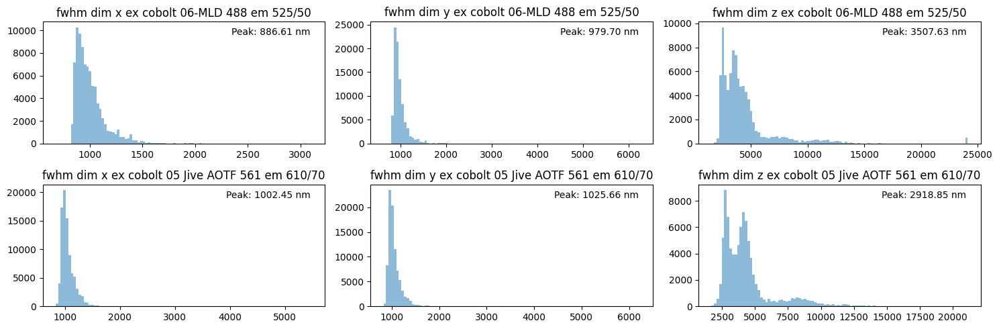

In [ ]:

bins = 100

# all_fwhm shape (3228, 3)
def add_peak_textbox(ax, data, bins=bins):
    hist, bin_edges = np.histogram(data, bins=40)  # Use the same number of bins as in the plot
    peak_bin_index = np.argmax(hist)
    peak_value = (bin_edges[peak_bin_index] + bin_edges[peak_bin_index + 1]) / 2  # Use the middle of the bin
    ax.text(0.95, 0.95, f'Peak: {peak_value:.2f} nm', 
            transform=ax.transAxes, 
            horizontalalignment='right', 
            verticalalignment='top',
            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

axes = ['x', 'y', 'z']

fig, axs = plt.subplots(len(all_fwhm.keys()), 3, figsize=(15, len(all_fwhm.keys())*2.5))

for c in all_fwhm.keys():
    fwhm_channel = np.array(all_fwhm[c])
    print(fwhm_channel.shape)   
    ch = channels[c]
    for dims in range(fwhm_channel.shape[1]):
        print(dims)
        if len(axs.shape) == 1:
            axs[dims].hist(fwhm_channel[:,dims], bins=bins, alpha=0.5, label=f'ch{c}')
            axs[dims].set_title(f'fwhm dim {axes[dims]} '+ ch)
            add_peak_textbox(axs[dims], fwhm_channel[:, dims])
        else:
            axs[c,dims].hist(fwhm_channel[:,dims], bins=bins, alpha=0.5, label=f'ch{c}')
            axs[c,dims].set_title(f'fwhm dim {axes[dims]} '+ ch)
            add_peak_textbox(axs[c, dims], fwhm_channel[:, dims])
plt.tight_layout()
plt.show()

In [ ]:
viewer.add_points(points[0], name='beads', size=5, face_color='red', edge_color='red')

<Points layer 'beads' at 0x2718078fe50>

In [ ]:
# filter psfse
max_fwhm_x_plus_y = 3000
max_fwhm_z = 30000
# run PSF analysis on mf-sim PSF and widefield PSF detecting the PSFs automatically
filtered_fwhm = {}
filtered_points = {}
print(len(all_fwhm[0]))
print(len(points))

for c in all_fwhm.keys():
    filtered_fwhm[c] = []
    filtered_points[c] = []

    # Convert `all_fwhm[c]` and `points` to NumPy arrays for vectorized operations
    all_fwhm_array = np.array(all_fwhm[c])  # Shape: (N, 3)
    points_array = np.array(points[c])         # Shape: (N, 3)

    # Apply conditions on fwhm_x, fwhm_y, and fwhm_z
    fwhm_x_plus_y = all_fwhm_array[:, 0] + all_fwhm_array[:, 1]
    condition = (fwhm_x_plus_y < max_fwhm_x_plus_y) & (all_fwhm_array[:, 2] < max_fwhm_z)

    # Filter using the boolean mask
    filtered_fwhm[c] = all_fwhm_array[condition]
    filtered_points[c] = points_array[condition]


    # for i in tqdm(range(len(points))):
    #     fwhm_x = np.array(all_fwhm[c])[i, 0]
    #     fwhm_y = np.array(all_fwhm[c])[i, 1]
    #     fwhm_z = np.array(all_fwhm[c])[i, 2]
        
    #     if fwhm_x + fwhm_y < max_fwhm_x_plus_y and fwhm_z < max_fwhm_z:
            
    #         filtered_fwhm[c].append([fwhm_x, fwhm_y, fwhm_z])
    #         filtered_points[c].append(points[i])

    #filtered_fwhm[c] = np.array(filtered_fwhm[c])

    avg = np.mean(filtered_fwhm[c], axis=0) 
    sd = np.std(filtered_fwhm[c], axis=0) 
    print('- ch0, Number of beads selected: {}'.format(filtered_fwhm[c].shape[0]))
    print('- X FWHM is {:.4f} +/- {:4f} nm'.format(avg[1], sd[1]))
    print('- Y FWHM is {:.4f} +/- {:4f} nm'.format(avg[0], sd[0]))
    print('- Z FWHM is {:.4f} +/- {:4f} nm'.format(avg[2], sd[2]))
'''
filtered_fwhm_ch2 = np.array(filtered_fwhm_ch2)
avg_wf = np.mean(filtered_fwhm_ch2, axis=0) 
sd_wf = np.std(filtered_fwhm_ch2, axis=0) 
print('- ch1, Number of beads selected: {}'.format(filtered_fwhm_ch2.shape[0]))
print('- X FWHM is {:.4f} +/- {:4f} nm'.format(avg_wf[1], sd_wf[1]))
print('- Y FWHM is {:.4f} +/- {:4f} nm'.format(avg_wf[0], sd_wf[0]))
print('- Z FWHM is {:.4f} +/- {:4f} nm'.format(avg_wf[2], sd_wf[2]))
'''
# add psfs to napari
print(len(filtered_points[0]))
      

88064
2
- ch0, Number of beads selected: 87472
- X FWHM is 982.1791 +/- 141.349658 nm
- Y FWHM is 997.3078 +/- 135.575675 nm
- Z FWHM is 4365.5417 +/- 2578.224818 nm
- ch0, Number of beads selected: 86260
- X FWHM is 1047.2324 +/- 128.810398 nm
- Y FWHM is 1047.2376 +/- 114.928745 nm
- Z FWHM is 4341.3720 +/- 1937.586897 nm
87472


Axial PSF within ROI: 3100.673564280829, ROI shape: (4096, 648)


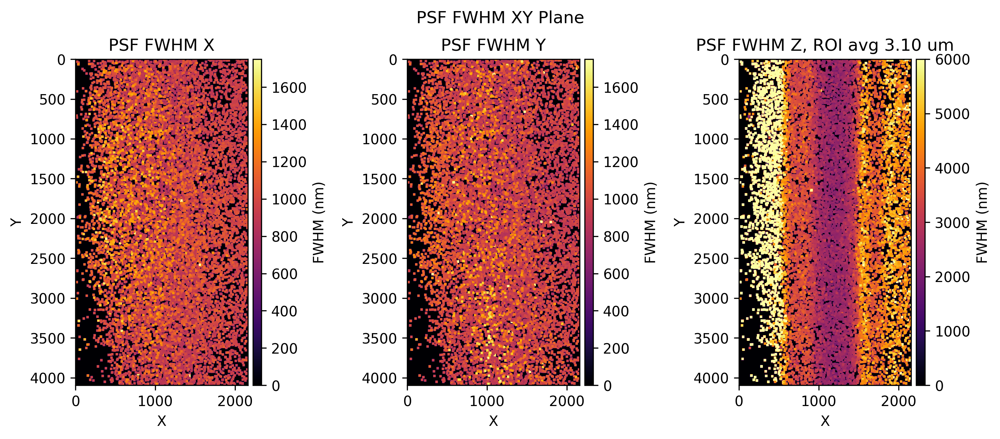

Axial PSF within ROI: 3941.1990135304463, ROI shape: (4096, 150)


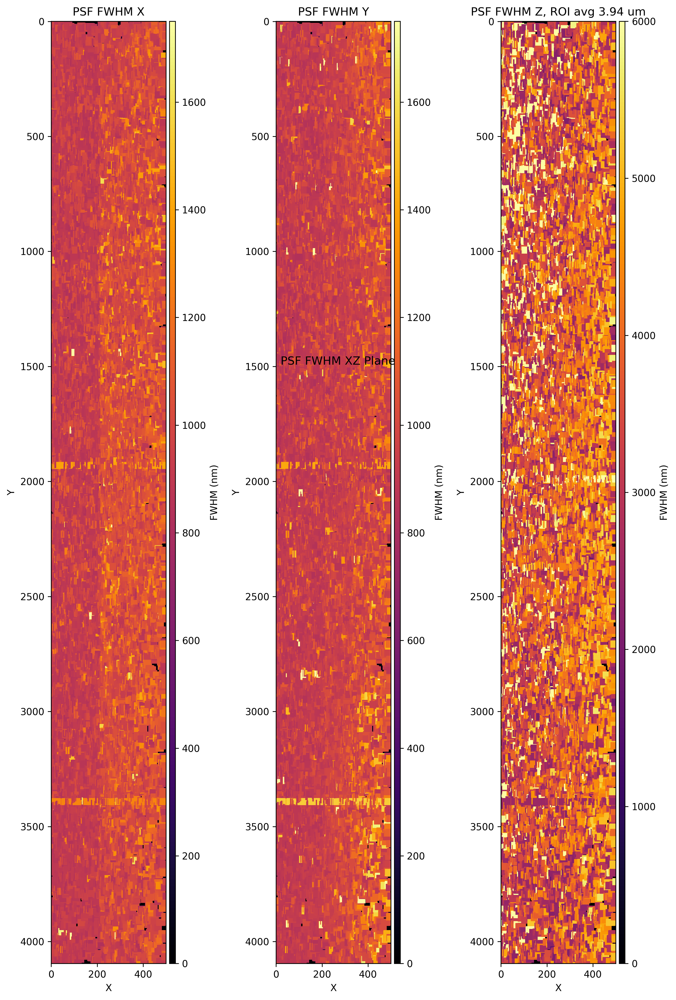

Axial PSF within ROI: 5192.472313820534, ROI shape: (2160, 150)


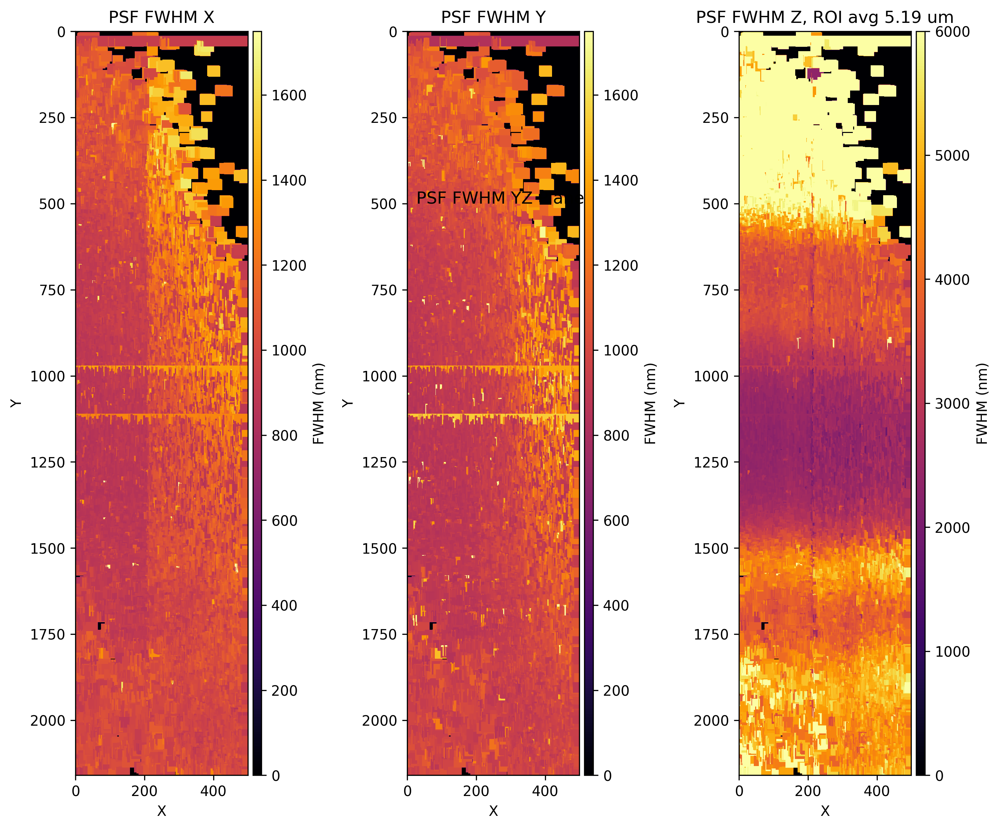

Axial PSF within ROI: 3353.9324599548722, ROI shape: (4096, 648)


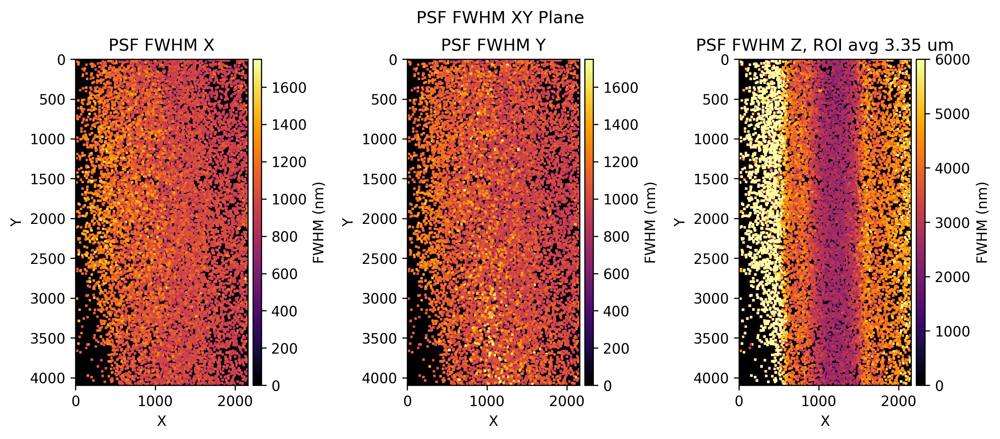

Axial PSF within ROI: 3920.176064355831, ROI shape: (4096, 150)


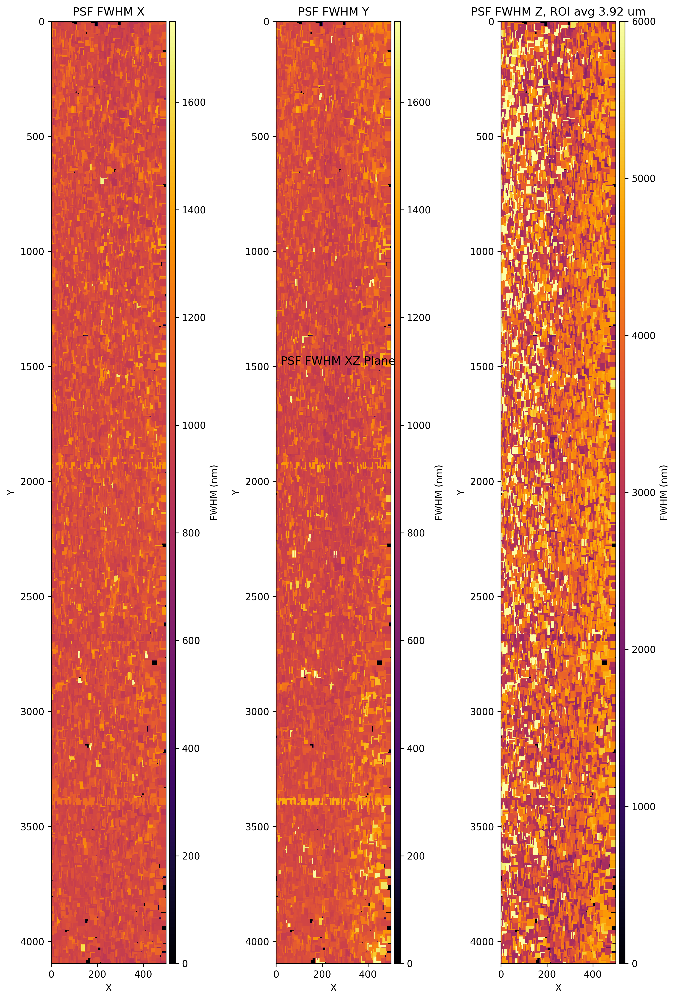

Axial PSF within ROI: 4976.215572567005, ROI shape: (2160, 150)


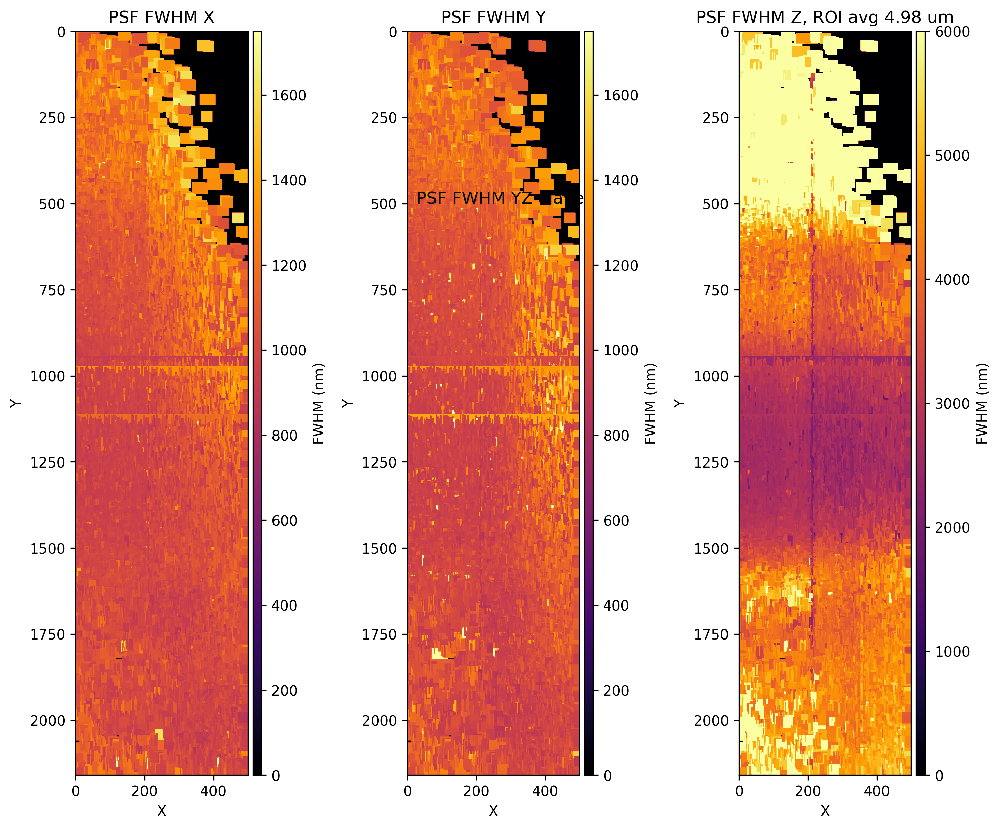

In [ ]:

import scipy

def add_square(grid, x, y, value, size=30):
    x_start = max(0, x - size // 2)
    x_end = min(grid.shape[1], x + size // 2 + 1)
    y_start = max(0, y - size // 2)
    y_end = min(grid.shape[0], y + size // 2 + 1)
    grid[y_start:y_end, x_start:x_end] = value


def plot(x, y, x_shape, y_shape, all_fwhm, title='psf',ytitle=0.63, ROI_scale=None, xshift=0, spotsize=30, scale_x = 1):

    fig, axs = plt.subplots(1, 3, figsize=(10, 15), dpi=300)
    fig.suptitle(title, y=ytitle)
    dim = ['X', 'Y', 'Z']
    for dims in range(all_fwhm.shape[1]):
        grid = np.zeros((x_shape, y_shape))
        for i in range(len(x)):
            add_square(grid, int(x[i]), int(y[i]), all_fwhm[i, dims], size=spotsize)
        scaled_grid = scipy.ndimage.zoom(grid, (1, scale_x), order=1)
        if dims < 2:
            im = axs[dims].imshow(scaled_grid, cmap='inferno', vmin=0, vmax=1750)#, origin='lower', extent=[0.5, x_max+0.5, 0.5, y_max+0.5])
        else:
            im = axs[dims].imshow(scaled_grid, cmap='inferno', vmax=6000)
        axs[dims].set_xlabel('X')
        axs[dims].set_ylabel('Y')
        divider = make_axes_locatable(axs[dims])
        cax = divider.append_axes("right", size="5%", pad=0.05)
        plt.colorbar(im, cax=cax, label='FWHM (nm)')
        if dims == 2 and ROI_scale!=None:   
            xy_tuple = (int(y_shape*0.5)-int((y_shape*ROI_scale)/2) + xshift,0)
            roi_values = grid[0:x_shape,xy_tuple[0]:xy_tuple[0]+int(y_shape*ROI_scale)]
            non_zero_values = roi_values[roi_values > 0]

            if len(non_zero_values) > 0:
                roi_average = np.mean(non_zero_values)
            else:
                roi_average = 0  
            axs[dims].set_title(f'PSF FWHM {dim[dims]}, ROI avg {(roi_average/1000):.2f} um')
            print(f'Axial PSF within ROI: {roi_average}, ROI shape: {roi_values.shape}')
            rect = Rectangle(xy_tuple, int(y_shape*ROI_scale), x_shape,
                             linewidth=2, edgecolor='cyan', facecolor='none')
            #axs[dims].add_patch(rect)
        else:
            axs[dims].set_title('PSF FWHM ' + dim[dims])
    fig.tight_layout()
    plt.show()

for c in filtered_fwhm.keys():
    #filtered_fwhm[c] = np.array(filtered_fwhm[c])
    #filtered_points[c] = np.array(filtered_points[c])
    z = [i[0] for i in filtered_points[c]]
    y = [i[1] for i in filtered_points[c]]
    x = [i[2] for i in filtered_points[c]]
    channel, z_max, y_max, x_max = stack.shape       #300 2160 4096
    plot(y,x,x_max, y_max, filtered_fwhm[c], title='PSF FWHM XY Plane', ytitle=0.63, ROI_scale=0.3, xshift=-150)    
    plot(z,x,x_max, z_max, filtered_fwhm[c], title='PSF FWHM XZ Plane', ytitle=0.63, ROI_scale=0.3, xshift=0)
    plot(z,y,y_max, z_max, filtered_fwhm[c], title='PSF FWHM YZ Plane', ytitle=0.63, ROI_scale=0.3, xshift=0)

In [13]:
plot(z,x,x_max, z_max, filtered_fwhm_ch1, title='PSF FWHM ZY Plane', ytitle=0.77, spotsize = 15, scale_x=(1.1261/0.345))#, ROI_scale=0.4, xshift=180)

NameError: name 'filtered_fwhm_ch1' is not defined

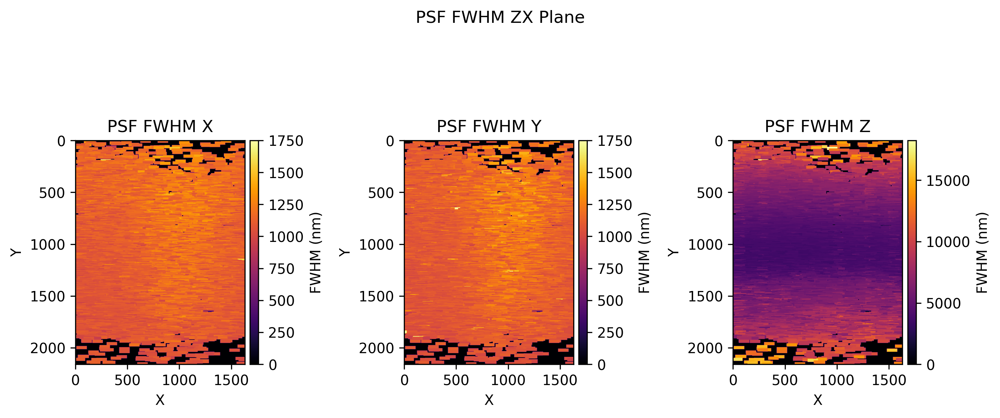

In [ ]:
plot(z,y,y_max, z_max, filtered_fwhm_ch1, title='PSF FWHM ZX Plane', ytitle=0.65, scale_x=(1.1261/0.345))#, ROI_scale=0.4, xshift=180)
    

## open

- ch0, Number of beads selected: 148
- X FWHM is 1032.7276 +/- 32.412016 nm
- Y FWHM is 1066.3471 +/- 42.057674 nm
- Z FWHM is 3775.9055 +/- 851.555637 nm
- ch1, Number of beads selected: 148
- X FWHM is 1016.1459 +/- 39.939394 nm
- Y FWHM is 1054.5272 +/- 43.497806 nm
- Z FWHM is 3530.8708 +/- 1083.448406 nm

## closed

- ch0, Number of beads selected: 65
- X FWHM is 1028.9332 +/- 37.861519 nm
- Y FWHM is 1068.4737 +/- 39.110956 nm
- Z FWHM is 6994.3048 +/- 352.527752 nm
- ch1, Number of beads selected: 65
- X FWHM is 1081.4379 +/- 43.590500 nm
- Y FWHM is 1072.6811 +/- 39.443397 nm
- Z FWHM is 7440.6675 +/- 569.794662 nm

### TODO

- show fwhm per plane
- crop FOV for open slit